In [60]:
!pip install watermark
!pip install prophet
!pip install neuralprophet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 137.1/137.1 kB 2.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 12.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 378.2/378.2 kB 16.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.1/70.1 kB 9.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 829.5/829.5 kB 20.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 887.5/887.5 MB 580.5 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 519.2/519.2 kB 49.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.8/5.8 MB 65.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.9/47.9 kB 5.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.4/10.4 MB 70.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 138.7/138.7 kB 15.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 185.2/185.2 kB 2

In [61]:
# Importação das bibliotecas

# Bibliotecas sistema
import re
import unicodedata
import itertools

# Biblioteca para manipulação de arquivos
import pandas as pd
import numpy as np

# Visualização de dados
import plotly
import seaborn as sns
import matplotlib.pylab as pl
import matplotlib as m
import matplotlib as mpl
import matplotlib.pyplot as plt
import plotly.express as px
from matplotlib import pyplot as plt

# Carregar as versões das bibliotecas
import watermark

# Versões das bibliotecas
%reload_ext watermark
%watermark -a "Versões das bibliotecas" --iversions

# Configuração para os gráficos largura e layout dos graficos
sns.set_theme(style='whitegrid')
plt.style.use('ggplot')

plt.rcParams["figure.figsize"] = (20, 10)
pd.set_option('display.expand_frame_repr', False)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

m.rcParams['axes.labelsize'] = 15
m.rcParams['xtick.labelsize'] = 15
m.rcParams['ytick.labelsize'] = 15
m.rcParams['text.color'] = 'k'

# Warnings retirar alertas
import warnings
warnings.filterwarnings("ignore")

# Versão do python
from platform import python_version
print('Versão python neste Jupyter Notebook:', python_version())

# @title Setup
from google.colab import auth
from google.cloud import bigquery
from google.colab import data_table

project = '-----' # Project ID inserted based on the query results selected to explore
location = '--' # Location inserted based on the query results selected to explore
client = bigquery.Client(project=project, location=location)
data_table.enable_dataframe_formatter()
auth.authenticate_user()

Author: Versões das bibliotecas

joblib    : 1.3.2
seaborn   : 0.12.2
google    : 2.0.3
plotly    : 5.15.0
re        : 2.2.1
watermark : 2.4.3
scipy     : 1.11.3
pandas    : 1.5.3
prophet   : 1.1.5
numpy     : 1.23.5
matplotlib: 3.7.1

Versão python neste Jupyter Notebook: 3.10.12


## Reference SQL syntax from the original job
Use the ```jobs.query```
[method](https://cloud.google.com/bigquery/docs/reference/rest/v2/jobs/query) to
return the SQL syntax from the job. This can be copied from the output cell
below to edit the query now or in the future. Alternatively, you can use
[this link](https://console.cloud.google.com/bigquery?j=samara-a2d79:US:bquxjob_2ede8eb6_18b8796b906)
back to BigQuery to edit the query within the BigQuery user interface.

In [62]:
# Running this code will display the query used to generate your previous job

job = client.get_job('----------') # Job ID inserted based on the query results selected to explore
print(job.query)

SELECT

  location,
  city,
  country,
  pollutant,
  value,
  timestamp,
  unit,
  source_name,
  latitude,
  longitude,
  averaged_over_in_hours,
  location_geom

FROM
  `bigquery-public-data.openaq.global_air_quality`;


# Result set loaded from BigQuery job as a DataFrame
Query results are referenced from the Job ID ran from BigQuery and the query
does not need to be re-run to explore results. The ```to_dataframe```
[method](https://googleapis.dev/python/bigquery/latest/generated/google.cloud.bigquery.job.QueryJob.html#google.cloud.bigquery.job.QueryJob.to_dataframe)
downloads the results to a Pandas DataFrame by using the BigQuery Storage API.

To edit query syntax, you can do so from the BigQuery SQL editor or in the
```Optional:``` sections below.

In [63]:
# Running this code will read results from your previous job

job = client.get_job('bquxjob_2ede8eb6_18b8796b906') # Job ID inserted based on the query results selected to explore
results = job.to_dataframe()
results

,location,city,country,pollutant,value,timestamp,unit,source_name,latitude,longitude,averaged_over_in_hours,location_geom
0,"Elbląg, ul. Bażyńskiego",Elbląg,PL,bc,0.26597,2022-05-10 13:00:00+00:00,µg/m³,GIOS,1.0,54.167847,19.410942,POINT(54.167847 1)
1,"Łask, ul. Narutowicza",Łask,PL,bc,0.13000,2022-05-09 09:00:00+00:00,µg/m³,GIOS,1.0,51.589261,19.131494,POINT(51.589261 1)
2,"Białystok, ul. Waszyngtona",Białystok,PL,bc,0.25000,2022-04-03 04:00:00+00:00,µg/m³,GIOS,1.0,53.126689,23.155869,POINT(53.126689 1)
3,"Tarnów, ul. Ks. Romana Sitko",Tarnów,PL,bc,0.56084,2022-04-28 18:00:00+00:00,µg/m³,GIOS,1.0,50.018253,20.992578,POINT(50.018253 1)
4,"Koziegłowy, os.Leśne",Koziegłowy,PL,bc,0.29248,2022-05-19 20:00:00+00:00,µg/m³,GIOS,1.0,52.449331,16.999683,POINT(52.449331 1)
...,...,...,...,...,...,...,...,...,...,...,...,...
5594609,Thabazimbi,Waterberg,ZA,pm25,14.76400,2022-05-20 01:00:00+00:00,µg/m³,South Africa,1.0,-24.591058,27.391605,POINT(-24.591058 1)
5594610,eMalahleni - SAWS,Nkangala,ZA,pm25,48.51200,2022-05-13 20:00:00+00:00,µg/m³,South Africa,1.0,-25.877861,29.186472,POINT(-25.877861 1)
5594611,Pelonomi-NAQI,Mangaung Metro,ZA,pm25,10.80000,2022-05-08 09:00:00+00:00,µg/m³,South Africa,1.0,-29.138507,26.241952,POINT(-29.138507 1)
5594612,Rosslyn-NAQI,City of Tshwane,ZA,pm25,30.31700,2022-05-05 02:00:00+00:00,µg/m³,South Africa,1.0,-25.625126,28.094740,POINT(-25.625126 1)


In [64]:
# Mudando variavel
data=results
data

,location,city,country,pollutant,value,timestamp,unit,source_name,latitude,longitude,averaged_over_in_hours,location_geom
0,"Elbląg, ul. Bażyńskiego",Elbląg,PL,bc,0.26597,2022-05-10 13:00:00+00:00,µg/m³,GIOS,1.0,54.167847,19.410942,POINT(54.167847 1)
1,"Łask, ul. Narutowicza",Łask,PL,bc,0.13000,2022-05-09 09:00:00+00:00,µg/m³,GIOS,1.0,51.589261,19.131494,POINT(51.589261 1)
2,"Białystok, ul. Waszyngtona",Białystok,PL,bc,0.25000,2022-04-03 04:00:00+00:00,µg/m³,GIOS,1.0,53.126689,23.155869,POINT(53.126689 1)
3,"Tarnów, ul. Ks. Romana Sitko",Tarnów,PL,bc,0.56084,2022-04-28 18:00:00+00:00,µg/m³,GIOS,1.0,50.018253,20.992578,POINT(50.018253 1)
4,"Koziegłowy, os.Leśne",Koziegłowy,PL,bc,0.29248,2022-05-19 20:00:00+00:00,µg/m³,GIOS,1.0,52.449331,16.999683,POINT(52.449331 1)
...,...,...,...,...,...,...,...,...,...,...,...,...
5594609,Thabazimbi,Waterberg,ZA,pm25,14.76400,2022-05-20 01:00:00+00:00,µg/m³,South Africa,1.0,-24.591058,27.391605,POINT(-24.591058 1)
5594610,eMalahleni - SAWS,Nkangala,ZA,pm25,48.51200,2022-05-13 20:00:00+00:00,µg/m³,South Africa,1.0,-25.877861,29.186472,POINT(-25.877861 1)
5594611,Pelonomi-NAQI,Mangaung Metro,ZA,pm25,10.80000,2022-05-08 09:00:00+00:00,µg/m³,South Africa,1.0,-29.138507,26.241952,POINT(-29.138507 1)
5594612,Rosslyn-NAQI,City of Tshwane,ZA,pm25,30.31700,2022-05-05 02:00:00+00:00,µg/m³,South Africa,1.0,-25.625126,28.094740,POINT(-25.625126 1)


In [65]:
# Filtrar apenas as entradas em que o valor da coluna 'country' é 'Brazil'
brazil_data = data[data['country'] == 'BR']

# salvar esses dados filtrados em um novo arquivo CSV
brazil_data.to_csv('brazil_data.csv', index=False)

# Exibir as primeiras linhas dos dados do Brasil
brazil_data

,location,city,country,pollutant,value,timestamp,unit,source_name,latitude,longitude,averaged_over_in_hours,location_geom
1375,Guarulhos-Pimentas,Guarulhos,BR,co,0.3,2022-05-15 05:00:00+00:00,ppm,Sao Paulo CETESB,1.0,-23.440117,-46.409949,POINT(-23.44011701 1)
1376,Mooca,São Paulo,BR,co,0.3,2022-05-25 21:00:00+00:00,ppm,Sao Paulo CETESB,1.0,-23.549734,-46.600417,POINT(-23.54973405 1)
1377,Pinheiros,São Paulo,BR,co,1.1,2022-05-20 14:00:00+00:00,ppm,Sao Paulo CETESB,1.0,-23.561460,-46.702017,POINT(-23.56145989 1)
1378,Congonhas,São Paulo,BR,co,0.8,2022-05-17 20:00:00+00:00,ppm,Sao Paulo CETESB,1.0,-23.616320,-46.663466,POINT(-23.61632008 1)
1379,Taboão da Serra,Taboão da Serra,BR,co,0.5,2022-05-02 16:00:00+00:00,ppm,Sao Paulo CETESB,1.0,-23.609324,-46.758294,POINT(-23.60932386 1)
...,...,...,...,...,...,...,...,...,...,...,...,...
5488067,Santana,São Paulo,BR,pm25,8.0,2022-05-11 13:00:00+00:00,µg/m³,Sao Paulo CETESB,1.0,-23.505993,-46.628960,POINT(-23.50599272 1)
5488068,Santos-Ponta da Praia,Santos,BR,pm25,10.0,2022-04-29 21:00:00+00:00,µg/m³,Sao Paulo CETESB,1.0,-23.981295,-46.300510,POINT(-23.98129516 1)
5488069,Santos-Ponta da Praia,Santos,BR,pm25,9.0,2022-05-18 02:00:00+00:00,µg/m³,Sao Paulo CETESB,1.0,-23.981295,-46.300510,POINT(-23.98129516 1)
5488070,Rio Claro-Jd.Guanabara,Rio Claro-Jd.Guanabara,BR,pm25,2.0,2022-05-06 12:00:00+00:00,µg/m³,Sao Paulo CETESB,1.0,-22.439044,-47.581473,POINT(-22.4390437888794 1)


In [66]:
brazil_data.timestamp.max()

Timestamp('2022-05-26 17:00:00+0000', tz='UTC')

In [67]:
brazil_data.timestamp.min()

Timestamp('2017-08-14 05:00:00+0000', tz='UTC')

In [68]:
# Suponha que você já carregou os dados do arquivo CSV como descrito anteriormente

# Converter a coluna "timestamp" para o tipo de data e hora
brazil_data['timestamp'] = pd.to_datetime(brazil_data['timestamp'])

# Extrair a data da coluna "timestamp" e armazená-la em uma nova coluna "date"
brazil_data['date'] = brazil_data['timestamp'].dt.date

# Agora a coluna "date" contém apenas a parte da data (sem o horário)

# Visualizar o DataFrame
brazil_data

,location,city,country,pollutant,value,timestamp,unit,source_name,latitude,longitude,averaged_over_in_hours,location_geom,date
1375,Guarulhos-Pimentas,Guarulhos,BR,co,0.3,2022-05-15 05:00:00+00:00,ppm,Sao Paulo CETESB,1.0,-23.440117,-46.409949,POINT(-23.44011701 1),2022-05-15
1376,Mooca,São Paulo,BR,co,0.3,2022-05-25 21:00:00+00:00,ppm,Sao Paulo CETESB,1.0,-23.549734,-46.600417,POINT(-23.54973405 1),2022-05-25
1377,Pinheiros,São Paulo,BR,co,1.1,2022-05-20 14:00:00+00:00,ppm,Sao Paulo CETESB,1.0,-23.561460,-46.702017,POINT(-23.56145989 1),2022-05-20
1378,Congonhas,São Paulo,BR,co,0.8,2022-05-17 20:00:00+00:00,ppm,Sao Paulo CETESB,1.0,-23.616320,-46.663466,POINT(-23.61632008 1),2022-05-17
1379,Taboão da Serra,Taboão da Serra,BR,co,0.5,2022-05-02 16:00:00+00:00,ppm,Sao Paulo CETESB,1.0,-23.609324,-46.758294,POINT(-23.60932386 1),2022-05-02
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5488067,Santana,São Paulo,BR,pm25,8.0,2022-05-11 13:00:00+00:00,µg/m³,Sao Paulo CETESB,1.0,-23.505993,-46.628960,POINT(-23.50599272 1),2022-05-11
5488068,Santos-Ponta da Praia,Santos,BR,pm25,10.0,2022-04-29 21:00:00+00:00,µg/m³,Sao Paulo CETESB,1.0,-23.981295,-46.300510,POINT(-23.98129516 1),2022-04-29
5488069,Santos-Ponta da Praia,Santos,BR,pm25,9.0,2022-05-18 02:00:00+00:00,µg/m³,Sao Paulo CETESB,1.0,-23.981295,-46.300510,POINT(-23.98129516 1),2022-05-18
5488070,Rio Claro-Jd.Guanabara,Rio Claro-Jd.Guanabara,BR,pm25,2.0,2022-05-06 12:00:00+00:00,µg/m³,Sao Paulo CETESB,1.0,-22.439044,-47.581473,POINT(-22.4390437888794 1),2022-05-06


In [69]:
# Definir a coluna "timestamp" como o índice do DataFrame
brazil_data.set_index('timestamp', inplace=True)
brazil_data

,location,city,country,pollutant,value,unit,source_name,latitude,longitude,averaged_over_in_hours,location_geom,date
timestamp,,,,,,,,,,,,
2022-05-15 05:00:00+00:00,Guarulhos-Pimentas,Guarulhos,BR,co,0.3,ppm,Sao Paulo CETESB,1.0,-23.440117,-46.409949,POINT(-23.44011701 1),2022-05-15
2022-05-25 21:00:00+00:00,Mooca,São Paulo,BR,co,0.3,ppm,Sao Paulo CETESB,1.0,-23.549734,-46.600417,POINT(-23.54973405 1),2022-05-25
2022-05-20 14:00:00+00:00,Pinheiros,São Paulo,BR,co,1.1,ppm,Sao Paulo CETESB,1.0,-23.561460,-46.702017,POINT(-23.56145989 1),2022-05-20
2022-05-17 20:00:00+00:00,Congonhas,São Paulo,BR,co,0.8,ppm,Sao Paulo CETESB,1.0,-23.616320,-46.663466,POINT(-23.61632008 1),2022-05-17
2022-05-02 16:00:00+00:00,Taboão da Serra,Taboão da Serra,BR,co,0.5,ppm,Sao Paulo CETESB,1.0,-23.609324,-46.758294,POINT(-23.60932386 1),2022-05-02
...,...,...,...,...,...,...,...,...,...,...,...,...
2022-05-11 13:00:00+00:00,Santana,São Paulo,BR,pm25,8.0,µg/m³,Sao Paulo CETESB,1.0,-23.505993,-46.628960,POINT(-23.50599272 1),2022-05-11
2022-04-29 21:00:00+00:00,Santos-Ponta da Praia,Santos,BR,pm25,10.0,µg/m³,Sao Paulo CETESB,1.0,-23.981295,-46.300510,POINT(-23.98129516 1),2022-04-29
2022-05-18 02:00:00+00:00,Santos-Ponta da Praia,Santos,BR,pm25,9.0,µg/m³,Sao Paulo CETESB,1.0,-23.981295,-46.300510,POINT(-23.98129516 1),2022-05-18


In [70]:
# Converter a coluna "timestamp" para o tipo de data e hora
brazil_data['date'] = pd.to_datetime(brazil_data['date'])
brazil_data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 83790 entries, 2022-05-15 05:00:00+00:00 to 2022-05-06 10:00:00+00:00
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   location                83790 non-null  object        
 1   city                    83790 non-null  object        
 2   country                 83790 non-null  object        
 3   pollutant               83790 non-null  object        
 4   value                   83790 non-null  float64       
 5   unit                    83790 non-null  object        
 6   source_name             83790 non-null  object        
 7   latitude                83790 non-null  float64       
 8   longitude               83790 non-null  float64       
 9   averaged_over_in_hours  83790 non-null  float64       
 10  location_geom           83790 non-null  object        
 11  date                    83790 non-null  datetime64[ns]
dtyp

In [71]:
brazil_data.pollutant.value_counts()

pm10    21945
o3      20658
no2     14838
pm25    12749
co       7506
so2      6094
Name: pollutant, dtype: int64

In [72]:
brazil_data.value.value_counts()

1.0      3173
0.0      2451
2.0      2302
9.0      1977
3.0      1964
         ... 
167.0       1
454.0       1
192.0       1
177.0       1
401.0       1
Name: value, Length: 235, dtype: int64

# **Análise dados**

## **Análise explorátoria estado São Paulo**

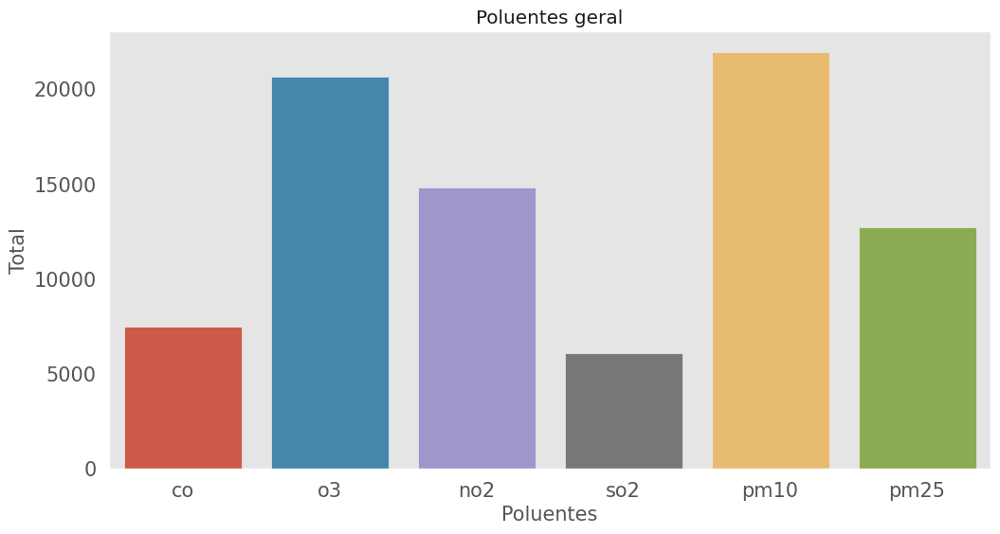

<Figure size 2000x1000 with 0 Axes>

In [73]:
# Gráfico barras particulas poluentes
plt.figure(figsize=(12, 6))
sns.countplot(data=brazil_data, x="pollutant")
plt.title("Poluentes geral")
plt.xlabel("Poluentes")
plt.ylabel("Total")
plt.grid(False)
plt.show()

# Define o nome do arquivo de saída e o formato (PNG no exemplo)
output_file = "Poluentes.png"
plt.savefig(output_file, format="png")

# Opcional para mostrar o gráfico na tela
plt.show()

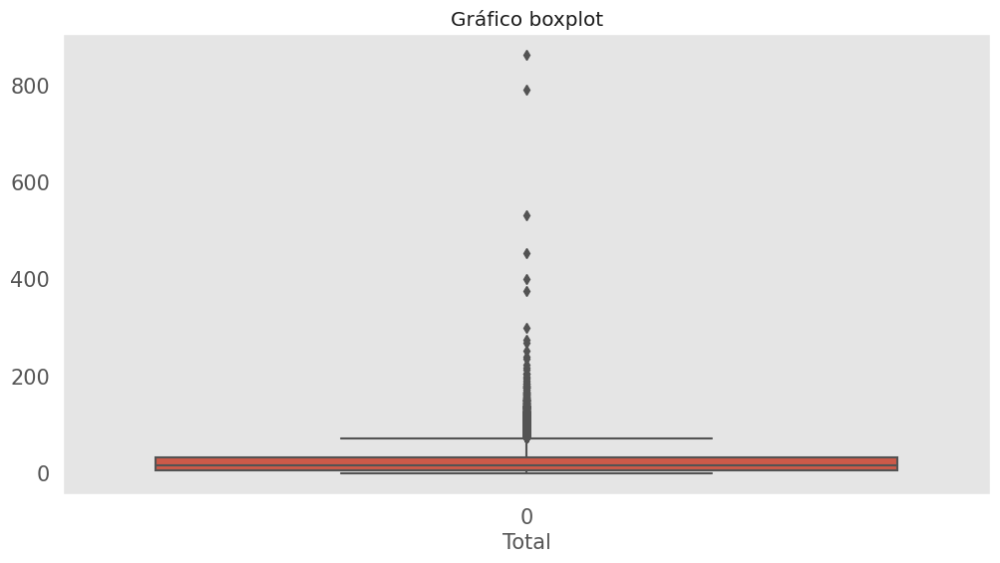

<Figure size 2000x1000 with 0 Axes>

In [74]:
# Gráfico boxplot
plt.figure(figsize=(12, 6))
sns.boxplot(brazil_data["value"])
plt.title("Gráfico boxplot")
plt.xlabel("Total")
plt.grid(False)
plt.show()

# Define o nome do arquivo de saída e o formato (PNG no exemplo)
output_file = "Poluentes2.png"
plt.savefig(output_file, format="png")

# Opcional para mostrar o gráfico na tela
plt.show()

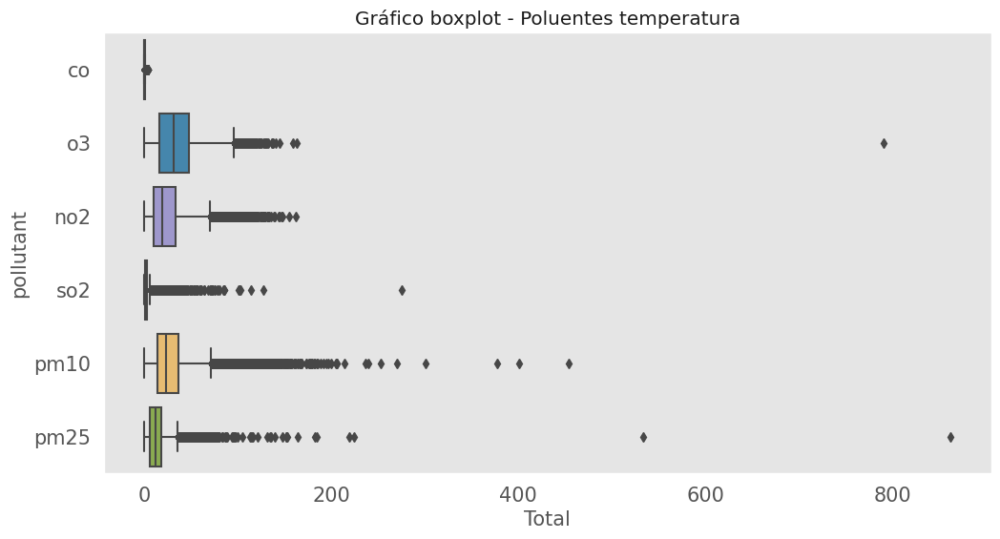

In [75]:
# Gráfico boxplot
plt.figure(figsize=(12, 6))
sns.boxplot(brazil_data, x="value", y="pollutant")
plt.title("Gráfico boxplot - Poluentes temperatura")
plt.xlabel("Total")
plt.grid(False)

# Define o nome do arquivo de saída e o formato (PNG no exemplo)
output_file = "Poluentes3.png"
plt.savefig(output_file, format="png")

# Opcional para mostrar o gráfico na tela
plt.show()

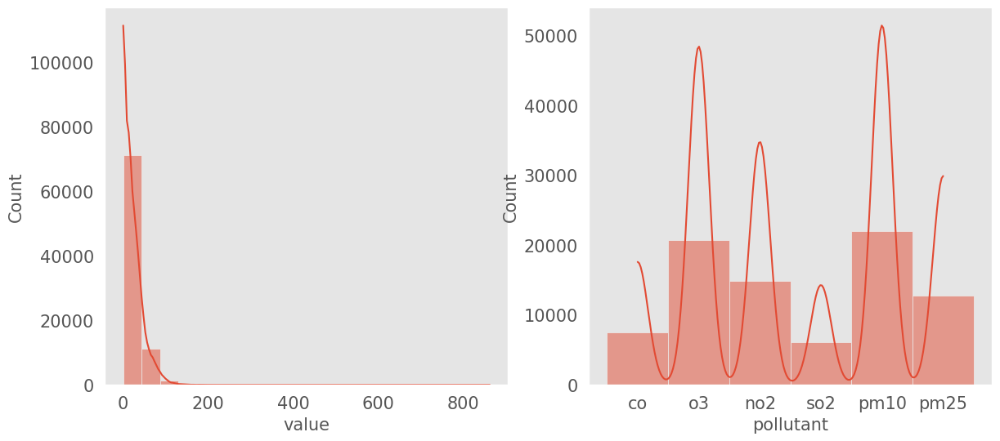

In [76]:
# 6. Distribuição de algumas variáveis
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.histplot(brazil_data['value'], bins=20, kde=True)
plt.grid(False)
plt.title('')

plt.subplot(1, 2, 2)
sns.histplot(brazil_data['pollutant'], bins=20, kde=True)
plt.title('')
plt.grid(False)

# Define o nome do arquivo de saída e o formato (PNG no exemplo)
output_file = "Poluentes4.png"
plt.savefig(output_file, format="png")

# Opcional para mostrar o gráfico na tela
plt.show()

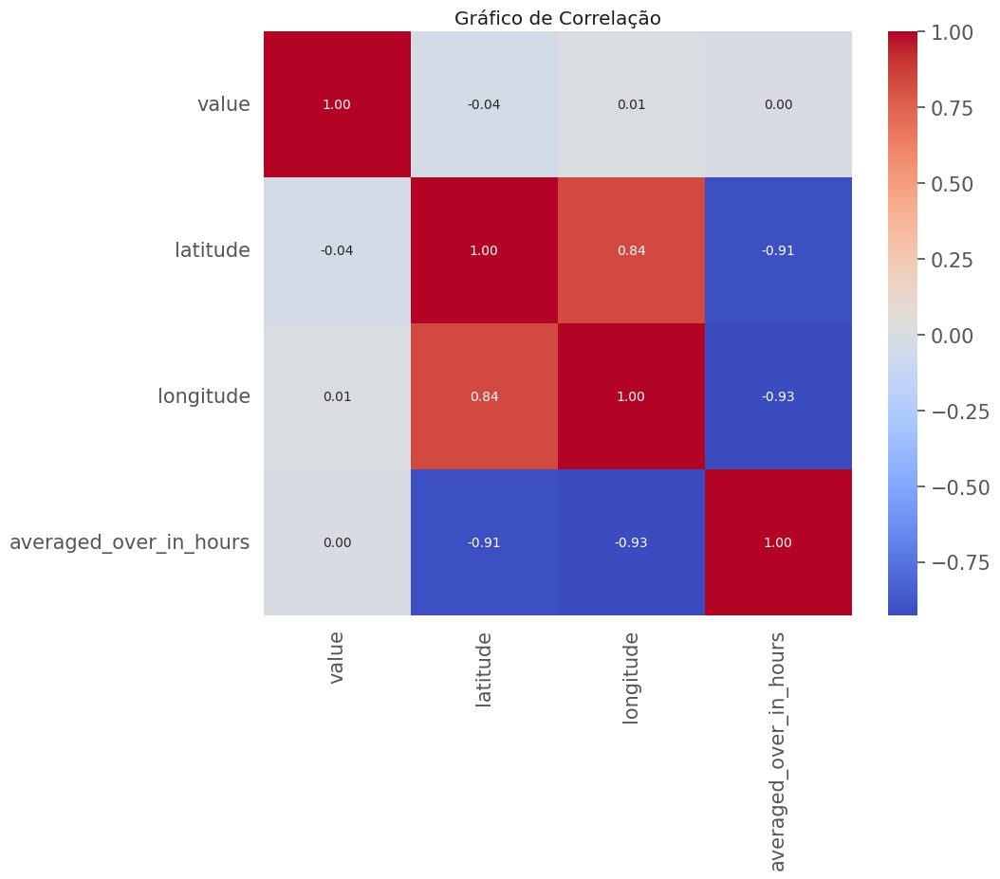

In [77]:
# Gráfico correlação

# Calcule a matriz de correlação
correlation_matrix = brazil_data.corr()

# Crie um gráfico de heatmap para visualizar a correlação
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Gráfico de Correlação")

# Define o nome do arquivo de saída e o formato (PNG no exemplo)
output_file = "Poluentes5.png"
plt.savefig(output_file, format="png")

# Opcional para mostrar o gráfico na tela
plt.show()

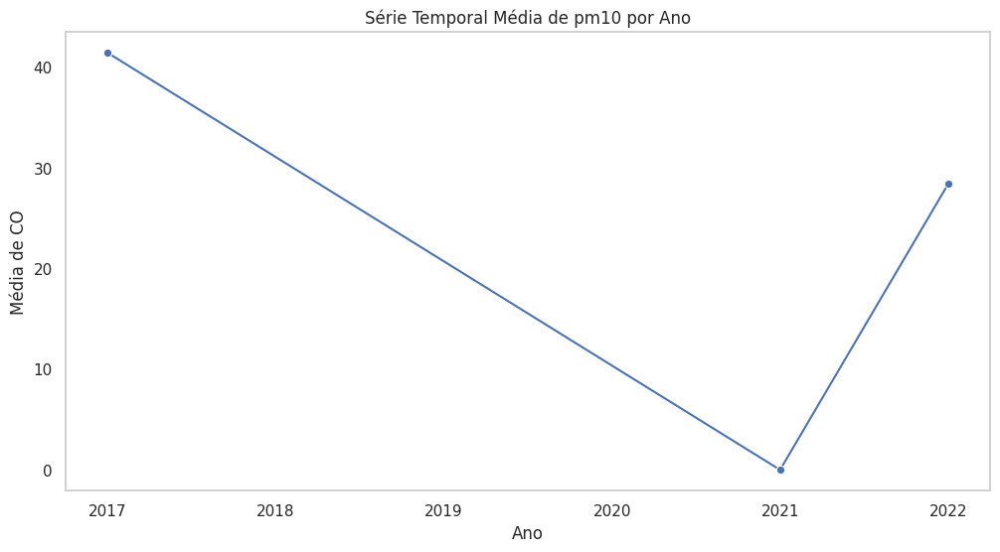

In [78]:
# Filtrar os dados apenas para o poluente "CO"
co_data = brazil_data[brazil_data['pollutant'] == 'pm10']

# Usar groupby para agrupar os dados por algum critério, por exemplo, por ano
co_data_grouped = co_data.groupby(co_data['date'].dt.year)

# Plotar um gráfico de linha usando Seaborn
plt.figure(figsize=(12, 6))
sns.set(style="whitegrid")
sns.lineplot(data=co_data_grouped['value'].mean(), marker="o")
plt.xlabel('Ano')
plt.ylabel('Média de CO')
plt.title('Série Temporal Média de pm10 por Ano')
plt.grid(False)

# Define o nome do arquivo de saída e o formato (PNG no exemplo)
output_file = "Série_Poluentes5.png"
plt.savefig(output_file, format="png")

# Opcional para mostrar o gráfico na tela
plt.show()

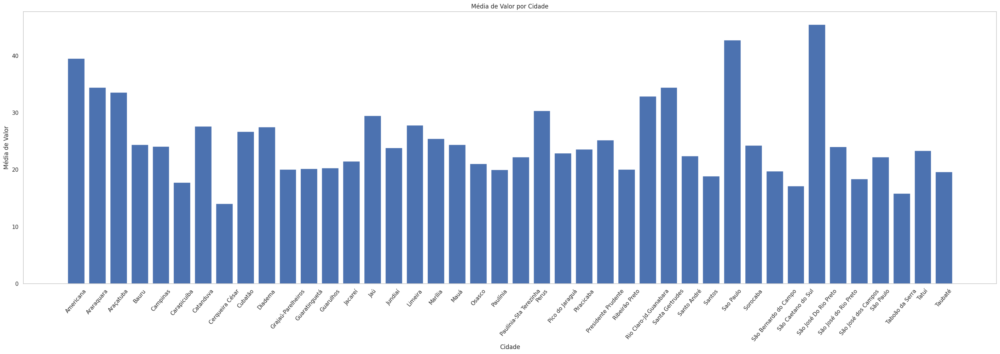

In [79]:
# Calcular a média dos valores por cidade
average_by_city = brazil_data.groupby('city')['value'].mean()

# Criar o gráfico de barras
plt.figure(figsize=(35.5, 10))
plt.bar(average_by_city.index, average_by_city.values)
plt.xlabel('Cidade')
plt.ylabel('Média de Valor')
plt.title('Média de Valor por Cidade')
plt.grid(False)

# Rotacionar os rótulos do eixo x em 45 graus
plt.xticks(rotation=50)

# Define o nome do arquivo de saída e o formato (PNG no exemplo)
output_file = "Série_Poluentes25.png"
plt.savefig(output_file, format="png")

# Opcional para mostrar o gráfico na tela
plt.show()

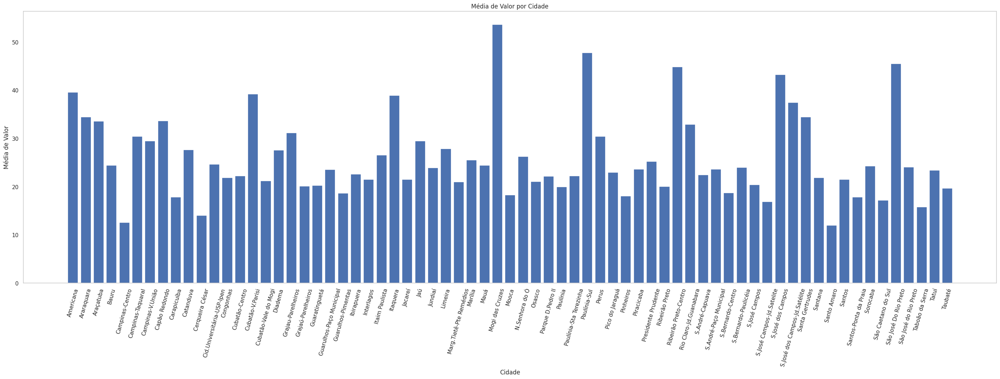

In [80]:
# Calcular a média dos valores por cidade
average_by_city = brazil_data.groupby('location')['value'].mean()

# Criar o gráfico de barras
plt.figure(figsize=(35.5, 10))
plt.bar(average_by_city.index, average_by_city.values)
plt.xlabel('Cidade')
plt.ylabel('Média de Valor')
plt.title('Média de Valor por Cidade')

# Rotacionar os rótulos do eixo x em 45 graus
plt.xticks(rotation=75)
plt.grid(False)

# Define o nome do arquivo de saída e o formato (PNG no exemplo)
output_file = "Série_Poluentes235.png"
plt.savefig(output_file, format="png")

# Opcional para mostrar o gráfico na tela
plt.show()

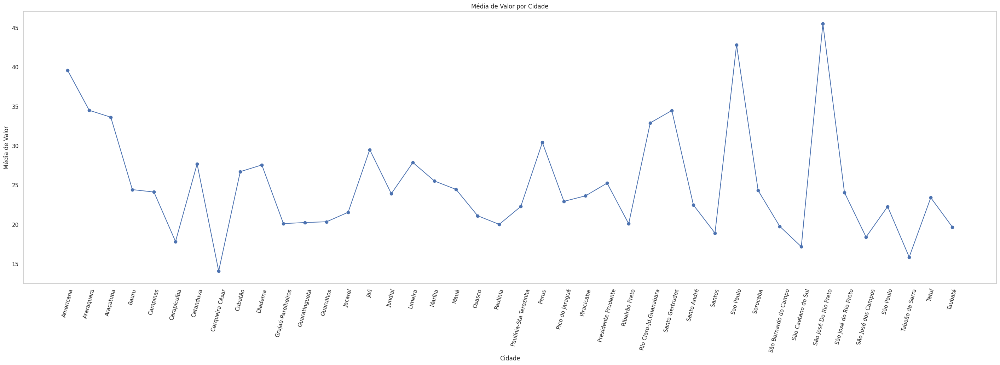

In [81]:
# Calcular a média dos valores por cidade
average_by_city = brazil_data.groupby('city')['value'].mean()

# Criar o gráfico de linha
plt.figure(figsize=(35.5, 10))
plt.plot(average_by_city.index, average_by_city.values, marker='o', linestyle='-')
plt.xlabel('Cidade')
plt.ylabel('Média de Valor')
plt.title('Média de Valor por Cidade')
plt.grid(False)

# Rotacionar os rótulos do eixo x em 45 graus
plt.xticks(rotation=75)

# Define o nome do arquivo de saída e o formato (PNG no exemplo)
output_file = "Série_Poluentes2335.png"
plt.savefig(output_file, format="png")

# Opcional para mostrar o gráfico na tela
plt.show()

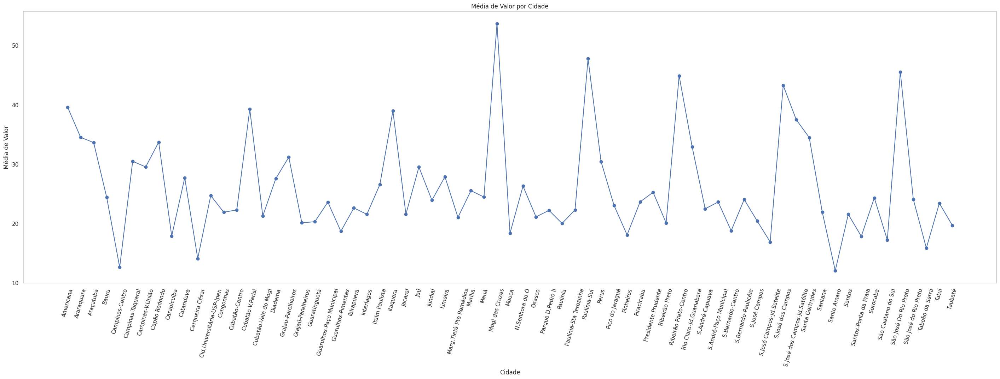

In [82]:
# Calcular a média dos valores por cidade
average_by_city = brazil_data.groupby('location')['value'].mean()

# Criar o gráfico de linha
plt.figure(figsize=(35.5, 10))
plt.plot(average_by_city.index, average_by_city.values, marker='o', linestyle='-')
plt.xlabel('Cidade')
plt.ylabel('Média de Valor')
plt.title('Média de Valor por Cidade')
plt.grid(False)

# Rotacionar os rótulos do eixo x em 45 graus
plt.xticks(rotation=75)

# Define o nome do arquivo de saída e o formato (PNG no exemplo)
output_file = "Série_Poluentes22335.png"
plt.savefig(output_file, format="png")

# Opcional para mostrar o gráfico na tela
plt.show()

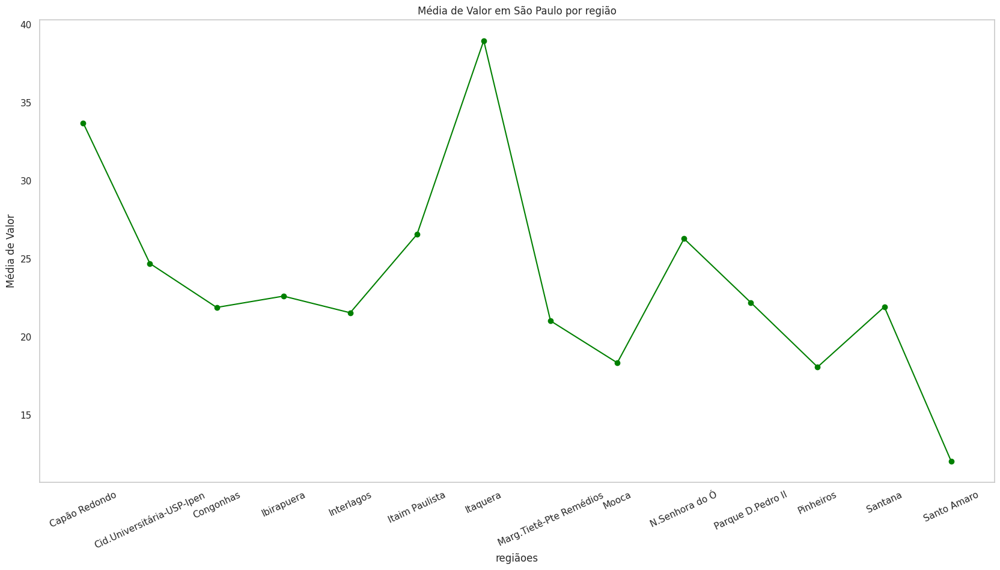

In [83]:
# Filtrar os dados apenas para a cidade de São Paulo
sao_paulo_data = brazil_data[brazil_data['city'] == 'São Paulo']

# Calcular a média dos valores para São Paulo
mean_sao_paulo = sao_paulo_data.groupby('location')['value'].mean()

# Criar um gráfico de linha
plt.figure(figsize=(20.5, 10))
plt.plot(mean_sao_paulo.index, mean_sao_paulo.values, marker='o', linestyle='-', color="green")
plt.xlabel('regiãoes')
plt.ylabel('Média de Valor')
plt.title('Média de Valor em São Paulo por região')
plt.grid(False)

# Rotacionar os rótulos do eixo x em 45 graus
plt.xticks(rotation=25)

# Define o nome do arquivo de saída e o formato (PNG no exemplo)
output_file = "Série_Poluentes_22335.png"
plt.savefig(output_file, format="png")

# Opcional para mostrar o gráfico na tela
plt.show()

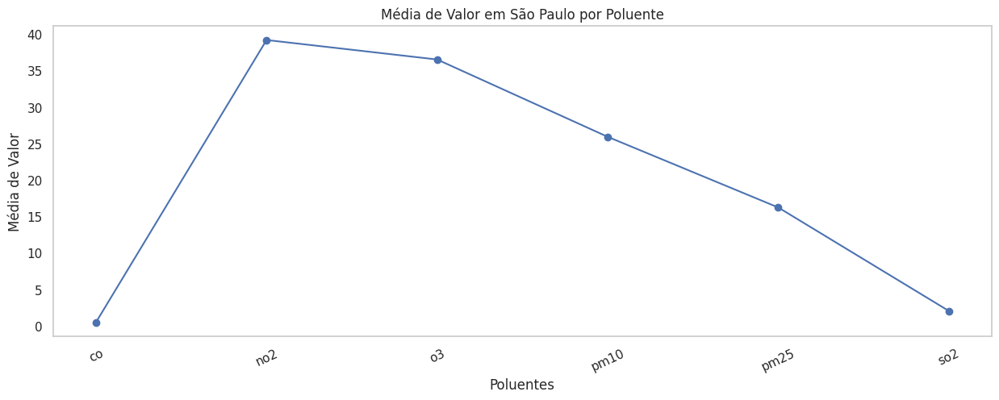

In [84]:
# Calcular a média dos valores para São Paulo
mean_sao_paulo = sao_paulo_data.groupby('pollutant')['value'].mean()

# Criar um gráfico de linha
plt.figure(figsize=(15, 5))
plt.plot(mean_sao_paulo.index, mean_sao_paulo.values, marker='o', linestyle='-')
plt.xlabel('Poluentes')
plt.ylabel('Média de Valor')
plt.title('Média de Valor em São Paulo por Poluente')
plt.grid(False)

# Rotacionar os rótulos do eixo x em 45 graus
plt.xticks(rotation=25)

output_file = "Série_Poluentes_25.png"
plt.savefig(output_file, format="png")

# Opcional para mostrar o gráfico na tela
plt.show()

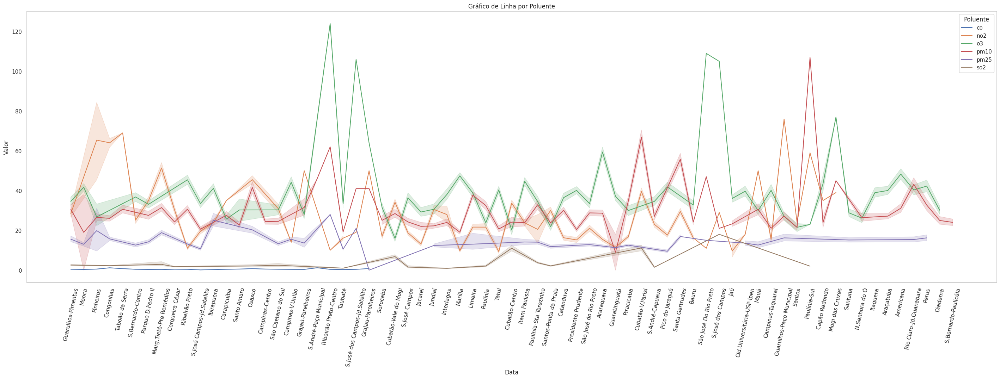

In [85]:
# Agrupe os dados por "pollutant"
grouped_data = brazil_data.groupby('pollutant')

# Crie um gráfico de linha usando Seaborn
plt.figure(figsize=(35.5, 10))  # Define o tamanho da figura

for name, group in grouped_data:
    sns.lineplot(x='location', y='value', data=group, label=name)

plt.xlabel('Data')
plt.ylabel('Valor')
plt.title('Gráfico de Linha por Poluente')
plt.legend(title='Poluente')
plt.grid(False)

# Rotacionar os rótulos do eixo x em 45 graus
plt.xticks(rotation=78)

output_file = "Série_Poluentes3_5.png"
plt.savefig(output_file, format="png")

# Opcional para mostrar o gráfico na tela
plt.show()

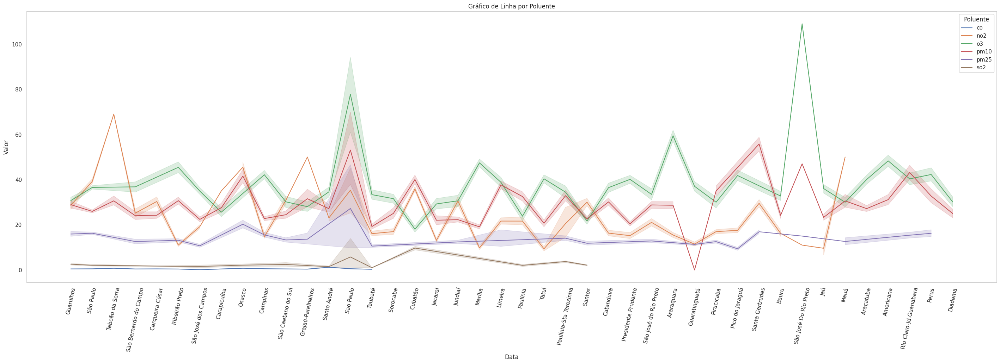

In [86]:
# Agrupe os dados por "pollutant"
grouped_data = brazil_data.groupby('pollutant')

# Crie um gráfico de linha usando Seaborn
plt.figure(figsize=(35.5, 10))  # Define o tamanho da figura

for name, group in grouped_data:
    sns.lineplot(x='city', y='value', data=group, label=name)

plt.xlabel('Data')
plt.ylabel('Valor')
plt.title('Gráfico de Linha por Poluente')
plt.legend(title='Poluente')
plt.grid(False)

# Rotacionar os rótulos do eixo x em 45 graus
plt.xticks(rotation=78)

output_file = "Série_Poluentes_35.png"
plt.savefig(output_file, format="png")

# Opcional para mostrar o gráfico na tela
plt.show()

# **Pré-processamento**

In [87]:
brazil_data

,location,city,country,pollutant,value,unit,source_name,latitude,longitude,averaged_over_in_hours,location_geom,date
timestamp,,,,,,,,,,,,
2022-05-15 05:00:00+00:00,Guarulhos-Pimentas,Guarulhos,BR,co,0.3,ppm,Sao Paulo CETESB,1.0,-23.440117,-46.409949,POINT(-23.44011701 1),2022-05-15
2022-05-25 21:00:00+00:00,Mooca,São Paulo,BR,co,0.3,ppm,Sao Paulo CETESB,1.0,-23.549734,-46.600417,POINT(-23.54973405 1),2022-05-25
2022-05-20 14:00:00+00:00,Pinheiros,São Paulo,BR,co,1.1,ppm,Sao Paulo CETESB,1.0,-23.561460,-46.702017,POINT(-23.56145989 1),2022-05-20
2022-05-17 20:00:00+00:00,Congonhas,São Paulo,BR,co,0.8,ppm,Sao Paulo CETESB,1.0,-23.616320,-46.663466,POINT(-23.61632008 1),2022-05-17
2022-05-02 16:00:00+00:00,Taboão da Serra,Taboão da Serra,BR,co,0.5,ppm,Sao Paulo CETESB,1.0,-23.609324,-46.758294,POINT(-23.60932386 1),2022-05-02
...,...,...,...,...,...,...,...,...,...,...,...,...
2022-05-11 13:00:00+00:00,Santana,São Paulo,BR,pm25,8.0,µg/m³,Sao Paulo CETESB,1.0,-23.505993,-46.628960,POINT(-23.50599272 1),2022-05-11
2022-04-29 21:00:00+00:00,Santos-Ponta da Praia,Santos,BR,pm25,10.0,µg/m³,Sao Paulo CETESB,1.0,-23.981295,-46.300510,POINT(-23.98129516 1),2022-04-29
2022-05-18 02:00:00+00:00,Santos-Ponta da Praia,Santos,BR,pm25,9.0,µg/m³,Sao Paulo CETESB,1.0,-23.981295,-46.300510,POINT(-23.98129516 1),2022-05-18


# **Limpeza dados**

In [88]:
# identificar valores ausentes
brazil_data.isnull()

,location,city,country,pollutant,value,unit,source_name,latitude,longitude,averaged_over_in_hours,location_geom,date
timestamp,,,,,,,,,,,,
2022-05-15 05:00:00+00:00,False,False,False,False,False,False,False,False,False,False,False,False
2022-05-25 21:00:00+00:00,False,False,False,False,False,False,False,False,False,False,False,False
2022-05-20 14:00:00+00:00,False,False,False,False,False,False,False,False,False,False,False,False
2022-05-17 20:00:00+00:00,False,False,False,False,False,False,False,False,False,False,False,False
2022-05-02 16:00:00+00:00,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...
2022-05-11 13:00:00+00:00,False,False,False,False,False,False,False,False,False,False,False,False
2022-04-29 21:00:00+00:00,False,False,False,False,False,False,False,False,False,False,False,False
2022-05-18 02:00:00+00:00,False,False,False,False,False,False,False,False,False,False,False,False


In [89]:
# Identificar valores não ausentes
brazil_data.notnull()

,location,city,country,pollutant,value,unit,source_name,latitude,longitude,averaged_over_in_hours,location_geom,date
timestamp,,,,,,,,,,,,
2022-05-15 05:00:00+00:00,True,True,True,True,True,True,True,True,True,True,True,True
2022-05-25 21:00:00+00:00,True,True,True,True,True,True,True,True,True,True,True,True
2022-05-20 14:00:00+00:00,True,True,True,True,True,True,True,True,True,True,True,True
2022-05-17 20:00:00+00:00,True,True,True,True,True,True,True,True,True,True,True,True
2022-05-02 16:00:00+00:00,True,True,True,True,True,True,True,True,True,True,True,True
...,...,...,...,...,...,...,...,...,...,...,...,...
2022-05-11 13:00:00+00:00,True,True,True,True,True,True,True,True,True,True,True,True
2022-04-29 21:00:00+00:00,True,True,True,True,True,True,True,True,True,True,True,True
2022-05-18 02:00:00+00:00,True,True,True,True,True,True,True,True,True,True,True,True


In [90]:
#  identificar duplicatas
brazil_data.duplicated()

timestamp
2022-05-15 05:00:00+00:00    False
2022-05-25 21:00:00+00:00    False
2022-05-20 14:00:00+00:00    False
2022-05-17 20:00:00+00:00    False
2022-05-02 16:00:00+00:00    False
                             ...  
2022-05-11 13:00:00+00:00    False
2022-04-29 21:00:00+00:00     True
2022-05-18 02:00:00+00:00    False
2022-05-06 12:00:00+00:00     True
2022-05-06 10:00:00+00:00     True
Length: 83790, dtype: bool

In [91]:
# Conte os valores nulos em cada coluna
brazil_data_valores_nulos = brazil_data.isnull().sum()
brazil_data_valores_nulos

location                  0
city                      0
country                   0
pollutant                 0
value                     0
unit                      0
source_name               0
latitude                  0
longitude                 0
averaged_over_in_hours    0
location_geom             0
date                      0
dtype: int64

In [92]:
# Conte os valores nulos em cada coluna
valores_nulos = brazil_data.isnull().sum()

# Conte o total de valores nulos em todo o DataFrame
total_valores_nulos = valores_nulos.sum()

# Exiba a contagem de valores nulos em cada coluna e o total
print("Valores Nulos por Coluna:")
print(valores_nulos)
print(f"Total de Valores Nulos em Todo o DataFrame: {total_valores_nulos}")

Valores Nulos por Coluna:
location                  0
city                      0
country                   0
pollutant                 0
value                     0
unit                      0
source_name               0
latitude                  0
longitude                 0
averaged_over_in_hours    0
location_geom             0
date                      0
dtype: int64
Total de Valores Nulos em Todo o DataFrame: 0


In [93]:
# Remova todas as linhas que contenham valores nulos
df_sem_nulos = brazil_data.dropna()
df_sem_nulos

,location,city,country,pollutant,value,unit,source_name,latitude,longitude,averaged_over_in_hours,location_geom,date
timestamp,,,,,,,,,,,,
2022-05-15 05:00:00+00:00,Guarulhos-Pimentas,Guarulhos,BR,co,0.3,ppm,Sao Paulo CETESB,1.0,-23.440117,-46.409949,POINT(-23.44011701 1),2022-05-15
2022-05-25 21:00:00+00:00,Mooca,São Paulo,BR,co,0.3,ppm,Sao Paulo CETESB,1.0,-23.549734,-46.600417,POINT(-23.54973405 1),2022-05-25
2022-05-20 14:00:00+00:00,Pinheiros,São Paulo,BR,co,1.1,ppm,Sao Paulo CETESB,1.0,-23.561460,-46.702017,POINT(-23.56145989 1),2022-05-20
2022-05-17 20:00:00+00:00,Congonhas,São Paulo,BR,co,0.8,ppm,Sao Paulo CETESB,1.0,-23.616320,-46.663466,POINT(-23.61632008 1),2022-05-17
2022-05-02 16:00:00+00:00,Taboão da Serra,Taboão da Serra,BR,co,0.5,ppm,Sao Paulo CETESB,1.0,-23.609324,-46.758294,POINT(-23.60932386 1),2022-05-02
...,...,...,...,...,...,...,...,...,...,...,...,...
2022-05-11 13:00:00+00:00,Santana,São Paulo,BR,pm25,8.0,µg/m³,Sao Paulo CETESB,1.0,-23.505993,-46.628960,POINT(-23.50599272 1),2022-05-11
2022-04-29 21:00:00+00:00,Santos-Ponta da Praia,Santos,BR,pm25,10.0,µg/m³,Sao Paulo CETESB,1.0,-23.981295,-46.300510,POINT(-23.98129516 1),2022-04-29
2022-05-18 02:00:00+00:00,Santos-Ponta da Praia,Santos,BR,pm25,9.0,µg/m³,Sao Paulo CETESB,1.0,-23.981295,-46.300510,POINT(-23.98129516 1),2022-05-18


In [94]:
# Se você quiser remover colunas que contenham valores nulos, você pode usar o argumento "axis=1":
df_sem_nulos = brazil_data.dropna(axis=1)

In [95]:
# Se você desejar remover apenas linhas onde todas as colunas sejam nulas, use o argumento "how='all'":
df_sem_nulos = brazil_data.dropna(how='all')
df_sem_nulos

,location,city,country,pollutant,value,unit,source_name,latitude,longitude,averaged_over_in_hours,location_geom,date
timestamp,,,,,,,,,,,,
2022-05-15 05:00:00+00:00,Guarulhos-Pimentas,Guarulhos,BR,co,0.3,ppm,Sao Paulo CETESB,1.0,-23.440117,-46.409949,POINT(-23.44011701 1),2022-05-15
2022-05-25 21:00:00+00:00,Mooca,São Paulo,BR,co,0.3,ppm,Sao Paulo CETESB,1.0,-23.549734,-46.600417,POINT(-23.54973405 1),2022-05-25
2022-05-20 14:00:00+00:00,Pinheiros,São Paulo,BR,co,1.1,ppm,Sao Paulo CETESB,1.0,-23.561460,-46.702017,POINT(-23.56145989 1),2022-05-20
2022-05-17 20:00:00+00:00,Congonhas,São Paulo,BR,co,0.8,ppm,Sao Paulo CETESB,1.0,-23.616320,-46.663466,POINT(-23.61632008 1),2022-05-17
2022-05-02 16:00:00+00:00,Taboão da Serra,Taboão da Serra,BR,co,0.5,ppm,Sao Paulo CETESB,1.0,-23.609324,-46.758294,POINT(-23.60932386 1),2022-05-02
...,...,...,...,...,...,...,...,...,...,...,...,...
2022-05-11 13:00:00+00:00,Santana,São Paulo,BR,pm25,8.0,µg/m³,Sao Paulo CETESB,1.0,-23.505993,-46.628960,POINT(-23.50599272 1),2022-05-11
2022-04-29 21:00:00+00:00,Santos-Ponta da Praia,Santos,BR,pm25,10.0,µg/m³,Sao Paulo CETESB,1.0,-23.981295,-46.300510,POINT(-23.98129516 1),2022-04-29
2022-05-18 02:00:00+00:00,Santos-Ponta da Praia,Santos,BR,pm25,9.0,µg/m³,Sao Paulo CETESB,1.0,-23.981295,-46.300510,POINT(-23.98129516 1),2022-05-18


In [96]:
# Remova todas as linhas duplicadas no DataFrame
df_sem_duplicatas = brazil_data.drop_duplicates().sum()
df_sem_duplicatas

location                  Guarulhos-PimentasMoocaPinheirosCongonhasTaboã...
city                      GuarulhosSão PauloSão PauloSão PauloTaboão da ...
country                   BRBRBRBRBRBRBRBRBRBRBRBRBRBRBRBRBRBRBRBRBRBRBR...
pollutant                 cococococococococococococococococococococococo...
value                                                             1648379.4
unit                      ppmppmppmppmppmppmppmppmppmppmppmppmppmppmppmp...
source_name               Sao Paulo CETESBSao Paulo CETESBSao Paulo CETE...
latitude                                                       56044.964409
longitude                                                   -1415997.504494
averaged_over_in_hours                                      -2865697.151285
location_geom             POINT(-23.44011701 1)POINT(-23.54973405 1)POIN...
dtype: object

# **Remoção Outliers**

Text(0, 0.5, 'Total')

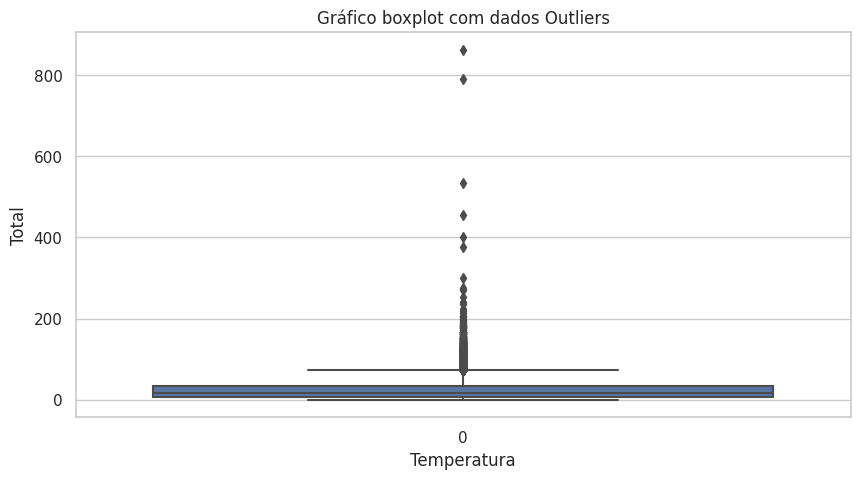

In [97]:
plt.figure(figsize=(10, 5))
sns.boxplot(brazil_data["value"])
plt.title("Gráfico boxplot com dados Outliers")
plt.xlabel("Temperatura")
plt.ylabel("Total")

In [98]:
# Importando biblioteca
from scipy import stats

# Método Estatístico (Z-Score): O método do Z-Score calcula o desvio padrão das observações e
# remove aquelas que estão muito distantes da média.
z_scores = np.abs(stats.zscore(brazil_data["value"]))
threshold = 3  # Ajuste esse valor conforme necessário
df_no_outliers_1 = brazil_data[(z_scores < threshold)]

In [99]:
# IQR (Intervalo Interquartil): O método do IQR identifica os quartis e remove as observações fora do intervalo IQR.

Q1 = brazil_data["value"].quantile(0.25)
Q3 = brazil_data["value"].quantile(0.75)

IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

df_no_outliers_2 = brazil_data[(brazil_data["value"] >= lower_bound) & (brazil_data["value"] <= upper_bound)]
df_no_outliers_2

,location,city,country,pollutant,value,unit,source_name,latitude,longitude,averaged_over_in_hours,location_geom,date
timestamp,,,,,,,,,,,,
2022-05-15 05:00:00+00:00,Guarulhos-Pimentas,Guarulhos,BR,co,0.3,ppm,Sao Paulo CETESB,1.0,-23.440117,-46.409949,POINT(-23.44011701 1),2022-05-15
2022-05-25 21:00:00+00:00,Mooca,São Paulo,BR,co,0.3,ppm,Sao Paulo CETESB,1.0,-23.549734,-46.600417,POINT(-23.54973405 1),2022-05-25
2022-05-20 14:00:00+00:00,Pinheiros,São Paulo,BR,co,1.1,ppm,Sao Paulo CETESB,1.0,-23.561460,-46.702017,POINT(-23.56145989 1),2022-05-20
2022-05-17 20:00:00+00:00,Congonhas,São Paulo,BR,co,0.8,ppm,Sao Paulo CETESB,1.0,-23.616320,-46.663466,POINT(-23.61632008 1),2022-05-17
2022-05-02 16:00:00+00:00,Taboão da Serra,Taboão da Serra,BR,co,0.5,ppm,Sao Paulo CETESB,1.0,-23.609324,-46.758294,POINT(-23.60932386 1),2022-05-02
...,...,...,...,...,...,...,...,...,...,...,...,...
2022-05-11 13:00:00+00:00,Santana,São Paulo,BR,pm25,8.0,µg/m³,Sao Paulo CETESB,1.0,-23.505993,-46.628960,POINT(-23.50599272 1),2022-05-11
2022-04-29 21:00:00+00:00,Santos-Ponta da Praia,Santos,BR,pm25,10.0,µg/m³,Sao Paulo CETESB,1.0,-23.981295,-46.300510,POINT(-23.98129516 1),2022-04-29
2022-05-18 02:00:00+00:00,Santos-Ponta da Praia,Santos,BR,pm25,9.0,µg/m³,Sao Paulo CETESB,1.0,-23.981295,-46.300510,POINT(-23.98129516 1),2022-05-18


In [100]:
# Método de Isolation Forest: O Isolation Forest é um algoritmo de aprendizado de máquina que detecta outliers
# usando uma abordagem baseada em árvores.

# Importando modelo
from sklearn.ensemble import IsolationForest

# Criando instância modelo
# Ajuste o valor de "contamination" conforme necessário
clf = IsolationForest(contamination=0.05)
clf

IsolationForest(contamination=0.05)

In [101]:
# Previsão model
outliers = clf.fit_predict(brazil_data[["value"]])

# Visualizando novo dataframe - df_no_outliers
df_no_outliers = brazil_data[outliers != -1]
df_no_outliers

,location,city,country,pollutant,value,unit,source_name,latitude,longitude,averaged_over_in_hours,location_geom,date
timestamp,,,,,,,,,,,,
2022-05-15 05:00:00+00:00,Guarulhos-Pimentas,Guarulhos,BR,co,0.3,ppm,Sao Paulo CETESB,1.0,-23.440117,-46.409949,POINT(-23.44011701 1),2022-05-15
2022-05-25 21:00:00+00:00,Mooca,São Paulo,BR,co,0.3,ppm,Sao Paulo CETESB,1.0,-23.549734,-46.600417,POINT(-23.54973405 1),2022-05-25
2022-05-20 14:00:00+00:00,Pinheiros,São Paulo,BR,co,1.1,ppm,Sao Paulo CETESB,1.0,-23.561460,-46.702017,POINT(-23.56145989 1),2022-05-20
2022-05-17 20:00:00+00:00,Congonhas,São Paulo,BR,co,0.8,ppm,Sao Paulo CETESB,1.0,-23.616320,-46.663466,POINT(-23.61632008 1),2022-05-17
2022-05-02 16:00:00+00:00,Taboão da Serra,Taboão da Serra,BR,co,0.5,ppm,Sao Paulo CETESB,1.0,-23.609324,-46.758294,POINT(-23.60932386 1),2022-05-02
...,...,...,...,...,...,...,...,...,...,...,...,...
2022-05-11 13:00:00+00:00,Santana,São Paulo,BR,pm25,8.0,µg/m³,Sao Paulo CETESB,1.0,-23.505993,-46.628960,POINT(-23.50599272 1),2022-05-11
2022-04-29 21:00:00+00:00,Santos-Ponta da Praia,Santos,BR,pm25,10.0,µg/m³,Sao Paulo CETESB,1.0,-23.981295,-46.300510,POINT(-23.98129516 1),2022-04-29
2022-05-18 02:00:00+00:00,Santos-Ponta da Praia,Santos,BR,pm25,9.0,µg/m³,Sao Paulo CETESB,1.0,-23.981295,-46.300510,POINT(-23.98129516 1),2022-05-18


<Axes: xlabel='pollutant', ylabel='value'>

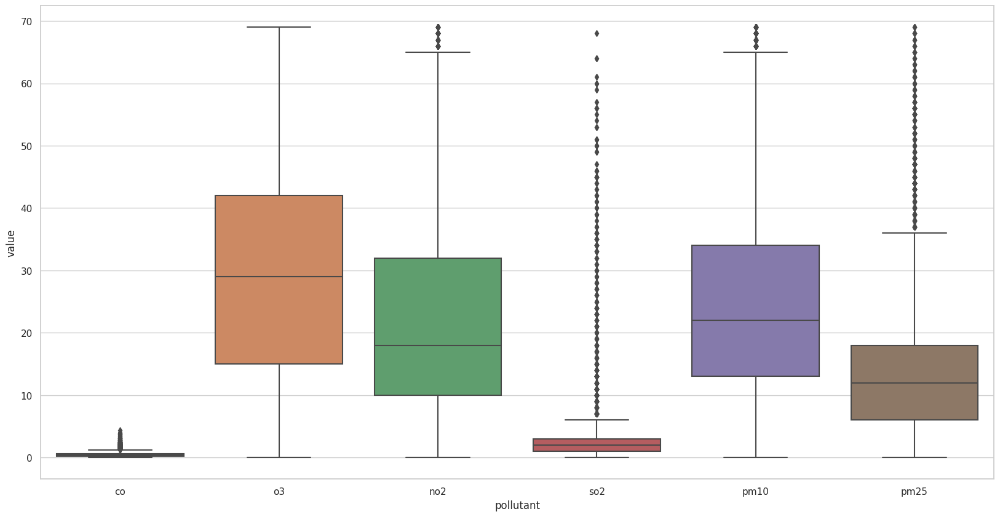

In [102]:
#plt.figure(figsize=(15, 5))
sns.boxplot(data=df_no_outliers, x="pollutant", y="value")

Text(0, 0.5, 'Total')

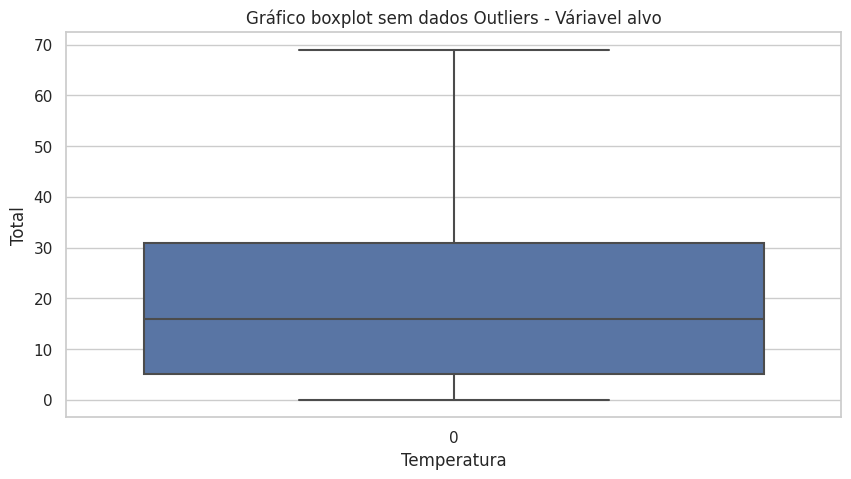

In [103]:
plt.figure(figsize=(10, 5))
sns.boxplot(df_no_outliers["value"])
plt.title("Gráfico boxplot sem dados Outliers - Váriavel alvo")
plt.xlabel("Temperatura")
plt.ylabel("Total")

# **Modelo serie temporal**

In [104]:
!pip install prophet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 801.0/801.0 kB 7.7 MB/s eta 0:00:00
  Attempting uninstall: holidays
    Found existing installation: holidays 0.21.13
    Uninstalling holidays-0.21.13:
      Successfully uninstalled holidays-0.21.13
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
neuralprophet 0.6.2 requires holidays<0.22,>=0.21, but you have holidays 0.35 which is incompatible.


In [105]:
# Renomenando colunas para modelo
df_no_outliers = df_no_outliers.rename(columns={"date": "ds", "value": "y"})
df_no_outliers

,location,city,country,pollutant,y,unit,source_name,latitude,longitude,averaged_over_in_hours,location_geom,ds
timestamp,,,,,,,,,,,,
2022-05-15 05:00:00+00:00,Guarulhos-Pimentas,Guarulhos,BR,co,0.3,ppm,Sao Paulo CETESB,1.0,-23.440117,-46.409949,POINT(-23.44011701 1),2022-05-15
2022-05-25 21:00:00+00:00,Mooca,São Paulo,BR,co,0.3,ppm,Sao Paulo CETESB,1.0,-23.549734,-46.600417,POINT(-23.54973405 1),2022-05-25
2022-05-20 14:00:00+00:00,Pinheiros,São Paulo,BR,co,1.1,ppm,Sao Paulo CETESB,1.0,-23.561460,-46.702017,POINT(-23.56145989 1),2022-05-20
2022-05-17 20:00:00+00:00,Congonhas,São Paulo,BR,co,0.8,ppm,Sao Paulo CETESB,1.0,-23.616320,-46.663466,POINT(-23.61632008 1),2022-05-17
2022-05-02 16:00:00+00:00,Taboão da Serra,Taboão da Serra,BR,co,0.5,ppm,Sao Paulo CETESB,1.0,-23.609324,-46.758294,POINT(-23.60932386 1),2022-05-02
...,...,...,...,...,...,...,...,...,...,...,...,...
2022-05-11 13:00:00+00:00,Santana,São Paulo,BR,pm25,8.0,µg/m³,Sao Paulo CETESB,1.0,-23.505993,-46.628960,POINT(-23.50599272 1),2022-05-11
2022-04-29 21:00:00+00:00,Santos-Ponta da Praia,Santos,BR,pm25,10.0,µg/m³,Sao Paulo CETESB,1.0,-23.981295,-46.300510,POINT(-23.98129516 1),2022-04-29
2022-05-18 02:00:00+00:00,Santos-Ponta da Praia,Santos,BR,pm25,9.0,µg/m³,Sao Paulo CETESB,1.0,-23.981295,-46.300510,POINT(-23.98129516 1),2022-05-18


In [106]:
# Importando bilioteca
from prophet import Prophet

# Criando modelo
model = Prophet()

# Treinamento modelo
model.fit(df_no_outliers)

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpvqhk9fr9/ifd3h2rb.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpvqhk9fr9/pc5pm8cm.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=12446', 'data', 'file=/tmp/tmpvqhk9fr9/ifd3h2rb.json', 'init=/tmp/tmpvqhk9fr9/pc5pm8cm.json', 'output', 'file=/tmp/tmpvqhk9fr9/prophet_model_rgru8ht/prophet_model-20231101045706.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:57:06 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:57:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [107]:
future = model.make_future_dataframe(periods=350)
future.head()

,ds
0,2017-08-14
1,2017-09-26
2,2017-09-30
3,2017-10-12
4,2017-10-13


In [108]:
forecast_1 = model.predict(future)
forecast_1

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2017-08-14,48.528873,35.271892,76.890172,48.528873,48.528873,7.552556,7.552556,7.552556,0.622235,0.622235,0.622235,6.930321,6.930321,6.930321,0.0,0.0,0.0,56.081429
1,2017-09-26,48.183690,27.393105,69.812628,48.183690,48.183690,0.143498,0.143498,0.143498,2.261160,2.261160,2.261160,-2.117662,-2.117662,-2.117662,0.0,0.0,0.0,48.327188
2,2017-09-30,48.151580,-11.418520,30.304191,48.151580,48.151580,-38.235941,-38.235941,-38.235941,-1.324837,-1.324837,-1.324837,-36.911104,-36.911104,-36.911104,0.0,0.0,0.0,9.915639
3,2017-10-12,48.055250,-14.428517,27.889352,48.055250,48.055250,-40.305497,-40.305497,-40.305497,-1.213916,-1.213916,-1.213916,-39.091581,-39.091581,-39.091581,0.0,0.0,0.0,7.749753
4,2017-10-13,48.047222,-10.978833,33.622692,48.047222,48.047222,-35.148939,-35.148939,-35.148939,-0.319796,-0.319796,-0.319796,-34.829143,-34.829143,-34.829143,0.0,0.0,0.0,12.898284
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
423,2023-05-07,31.735925,-5.359268,36.260818,31.735863,31.735978,-17.167314,-17.167314,-17.167314,-1.044882,-1.044882,-1.044882,-16.122431,-16.122431,-16.122431,0.0,0.0,0.0,14.568611
424,2023-05-08,31.727899,-4.530008,37.581688,31.727837,31.727953,-15.484279,-15.484279,-15.484279,0.622235,0.622235,0.622235,-16.106514,-16.106514,-16.106514,0.0,0.0,0.0,16.243619
425,2023-05-09,31.719873,-2.711342,39.683180,31.719810,31.719927,-13.760412,-13.760412,-13.760412,2.261160,2.261160,2.261160,-16.021572,-16.021572,-16.021572,0.0,0.0,0.0,17.959461
426,2023-05-10,31.711847,-5.563837,36.542938,31.711784,31.711902,-14.859219,-14.859219,-14.859219,1.020035,1.020035,1.020035,-15.879255,-15.879255,-15.879255,0.0,0.0,0.0,16.852628


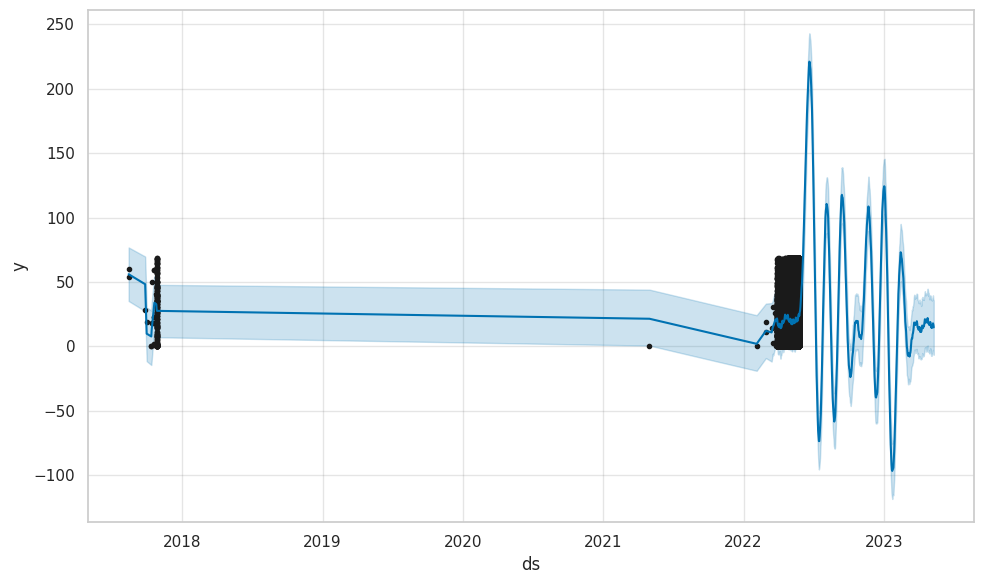

In [109]:
fig = model.plot(forecast_1)

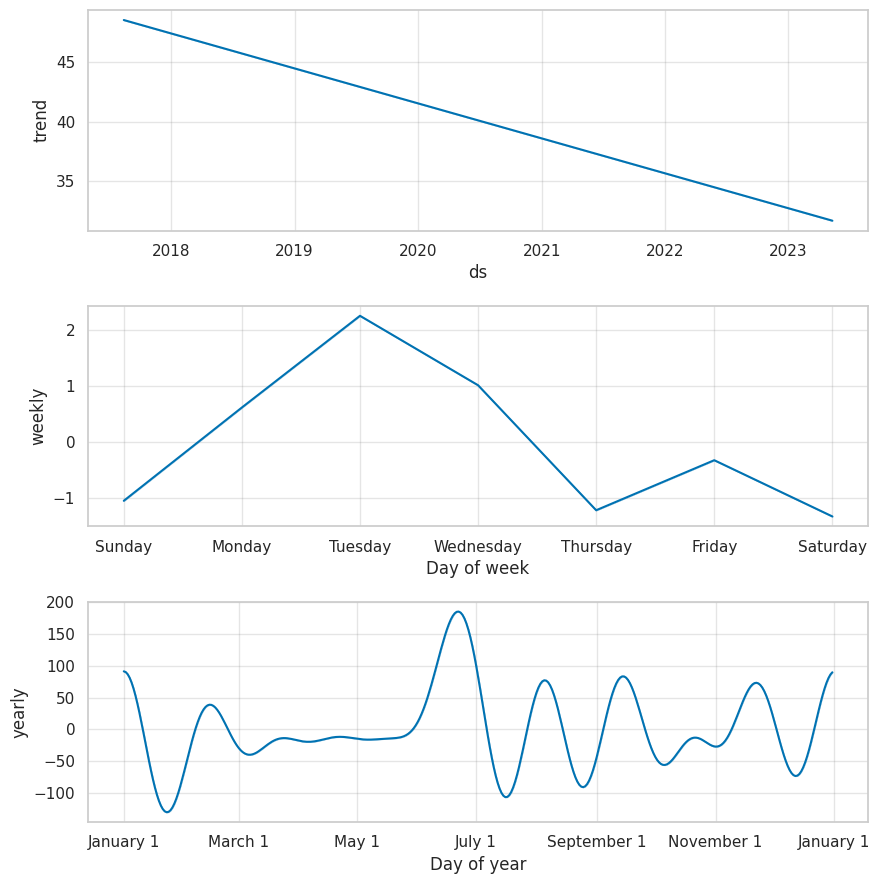

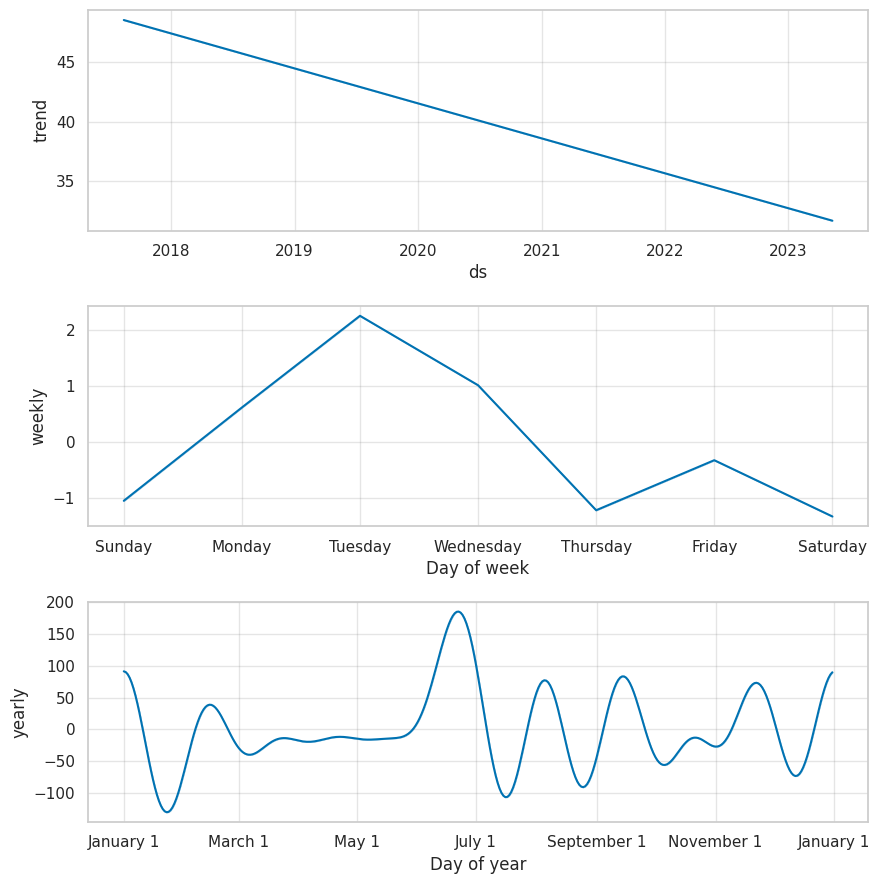

In [110]:
# Components modelo
modelo_serie_temporal_components = model.plot_components(forecast_1)
modelo_serie_temporal_components

In [111]:
# Melhores previsão
forecast_1[['ds',
          'yhat',
          'yhat_lower',
          'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
423,2023-05-07,14.568611,-5.359268,36.260818
424,2023-05-08,16.243619,-4.530008,37.581688
425,2023-05-09,17.959461,-2.711342,39.683180
426,2023-05-10,16.852628,-5.563837,36.542938
427,2023-05-11,14.796334,-6.443714,35.904342


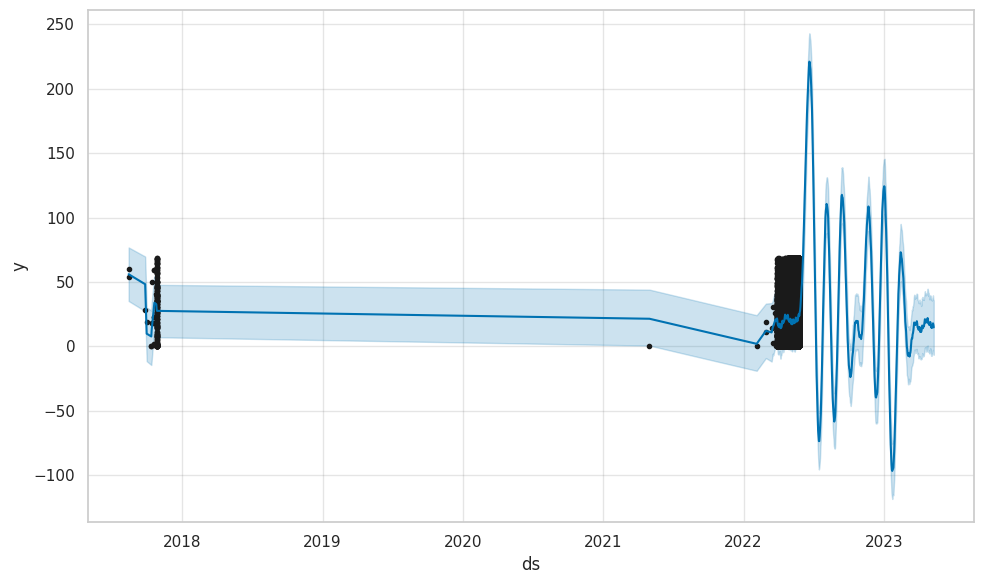

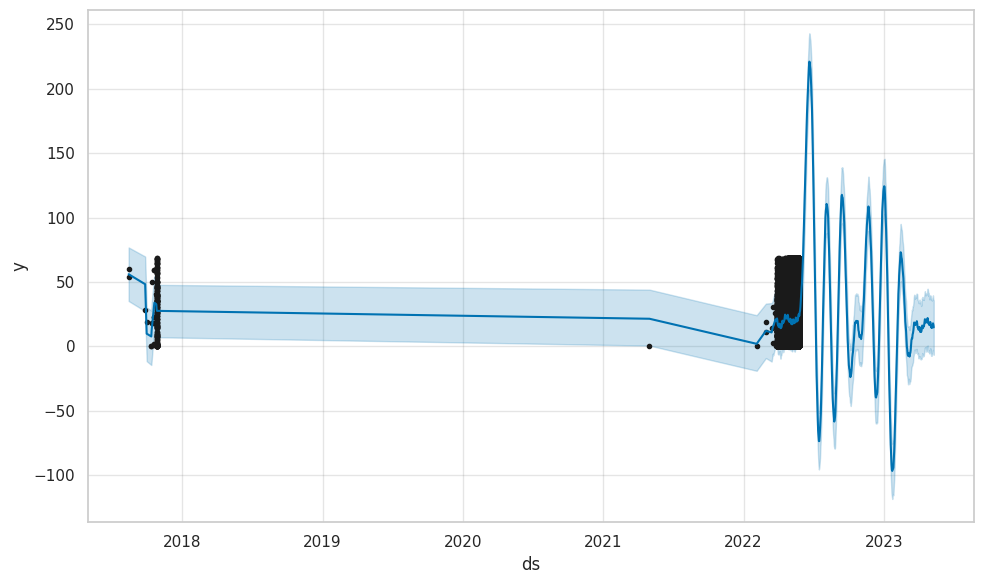

In [112]:
# Plot previsão modelo
fig1 = model.plot(forecast_1)
fig1

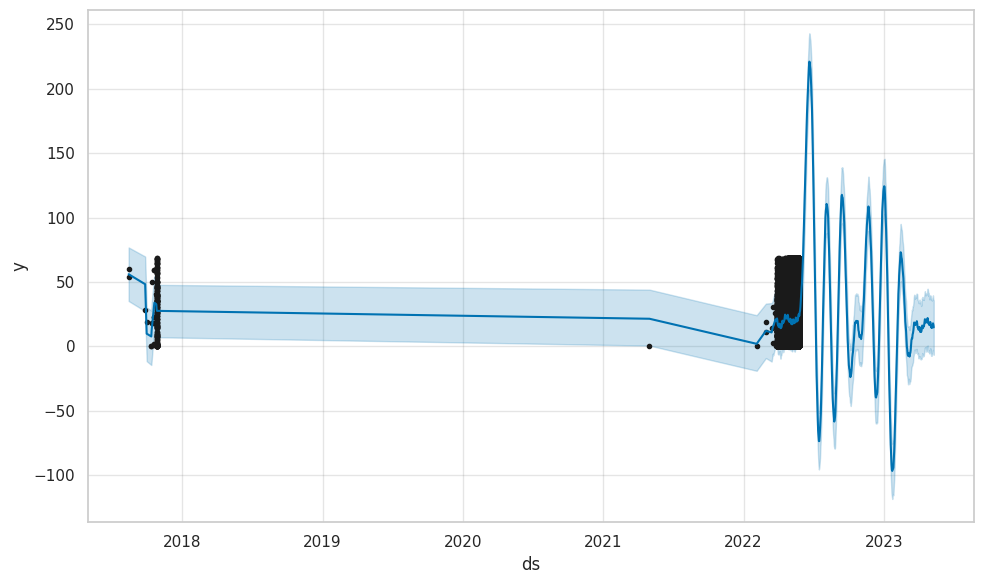

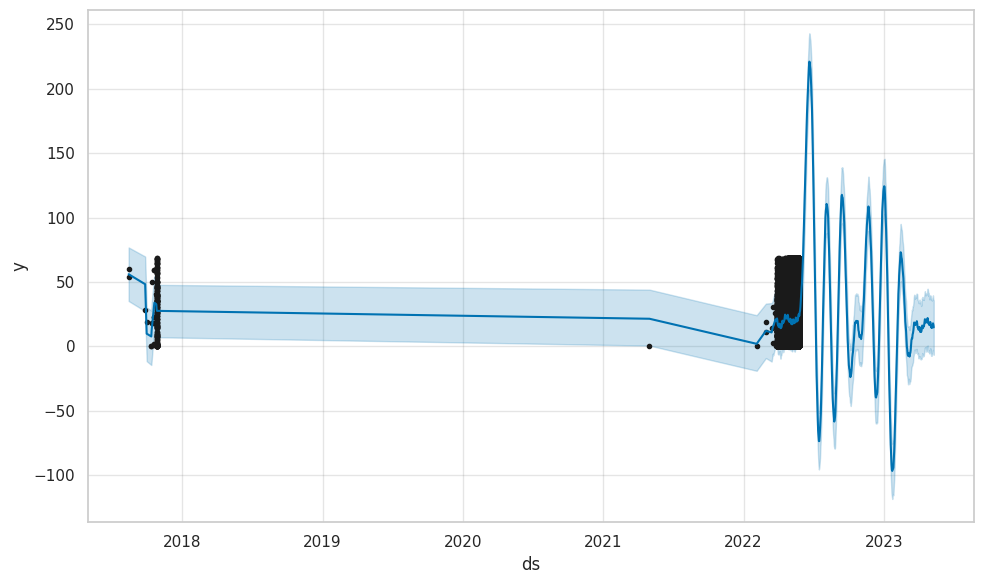

In [113]:
# Plot modelo
model.plot(forecast_1)

In [114]:
# Importando biblioteca
import joblib

# Suponha que 'model' seja o seu modelo treinado
joblib.dump(model, 'modelo_serie_temporal_prophet.pkl')

['modelo_serie_temporal_prophet.pkl']

# **Modelo 2 - Neural Prophet**

In [115]:
#pip install neuralprophet

In [116]:
df_no_outliers = df_no_outliers.drop_duplicates(subset=["ds"])

In [117]:
df_no_outliers = df_no_outliers.groupby("ds")["y"].sum().reset_index()

In [118]:
# Carregando Bibliotecas série temporal
import prophet
from prophet import Prophet
from neuralprophet import NeuralProphet, set_log_level
from neuralprophet import set_random_seed

# Craindo modelo
model = NeuralProphet()

# Treinamento modelo
model.fit(df_no_outliers, freq='D')

WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 83.333% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 83.333% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO:NP.utils:Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 16
INFO:NP.config:Auto-set batch_size to 

Finding best initial lr:   0%|          | 0/206 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

,MAE,RMSE,Loss,RegLoss,epoch
0,47.194752,54.214806,0.969612,0.0,0
1,47.203709,54.415596,0.969097,0.0,1
2,47.268745,54.641468,0.972206,0.0,2
3,47.187141,53.977882,0.969670,0.0,3
4,46.739666,54.053612,0.956469,0.0,4
...,...,...,...,...,...
628,4.893091,8.094635,0.041582,0.0,628
629,4.755423,9.314890,0.039650,0.0,629
630,4.694198,9.213230,0.037704,0.0,630
631,4.699399,8.122881,0.037633,0.0,631


In [119]:
# 30 períodos futuros
future = model.make_future_dataframe(df_no_outliers,
                                     periods=650,
                                     n_historic_predictions=len(df_no_outliers))

# Visualizando
future.head()

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 83.333% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 83.333% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column


,ds,y
0,2017-08-14,54.0
1,2017-09-26,28.0
2,2017-09-30,19.0
3,2017-10-12,0.3
4,2017-10-13,18.0


In [120]:
# Previsão modelo
forecast = model.predict(future)
forecast

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 98.214% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 98.214% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 98.214% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 98.214% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D


Predicting: 5it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column


,ds,y,yhat1,trend,season_yearly,season_weekly
0,2017-08-14,54.0,53.579853,36.708008,18.002901,-1.131058
1,2017-09-26,28.0,27.935402,36.363640,-10.734117,2.305879
2,2017-09-30,19.0,19.117283,36.331604,-16.838964,-0.375355
3,2017-10-12,0.3,11.505117,36.235500,-24.471169,-0.259216
4,2017-10-13,18.0,11.828290,36.227493,-24.379967,-0.019237
...,...,...,...,...,...,...
723,2024-03-02,NaN,14.455995,18.282909,-3.451560,-0.375355
724,2024-03-03,NaN,17.494900,18.283184,-2.605724,1.817441
725,2024-03-04,NaN,15.311183,18.283459,-1.841217,-1.131058
726,2024-03-05,NaN,19.425058,18.283733,-1.164555,2.305879


In [121]:
# Plot modelo
model.plot(forecast)

WARNING - (NP.plotting.log_warning_resampler_switch_to_valid_env) - Warning: plotly-resampler not supported for the environment you are using. Plotting backend automatically switched to 'plotly' without resampling 


In [122]:
# Parametros modelo
model_fig = model.plot_parameters()
model_fig

WARNING - (NP.plotting.log_warning_resampler_switch_to_valid_env) - Warning: plotly-resampler not supported for the environment you are using. Plotting backend automatically switched to 'plotly' without resampling 


In [123]:
# Components modelo
model.plot_components(forecast)

WARNING - (NP.plotting.log_warning_resampler_switch_to_valid_env) - Warning: plotly-resampler not supported for the environment you are using. Plotting backend automatically switched to 'plotly' without resampling 


In [124]:
# Plot dos parameters e visualizando sazonalidade modelo
model.plot_parameters(components=["seasonality"])

WARNING - (NP.plotting.log_warning_resampler_switch_to_valid_env) - Warning: plotly-resampler not supported for the environment you are using. Plotting backend automatically switched to 'plotly' without resampling 


In [125]:
# Métricas modelo
metrics_model2 = model.test(df_no_outliers)
metrics_model2

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 83.333% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 83.333% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D


Testing: 0it [00:00, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         Loss_test         │    0.03834497183561325    │
│          MAE_val          │     4.717909812927246     │
│         RMSE_val          │     9.888223648071289     │
│       RegLoss_test        │            0.0            │
└───────────────────────────┴───────────────────────────┘

,MAE_val,RMSE_val,Loss_test,RegLoss_test
0,4.71791,9.888224,0.038345,0.0


In [126]:
## Salvando modelo serie temporal

# Suponha que 'model' seja o seu modelo treinado
joblib.dump(model, 'modelo_neural_prophet.pkl')

['modelo_neural_prophet.pkl']

# **Modelo 3 - Neural Prophet Sazonalidade**

In [127]:
# Importando biblioteca
from neuralprophet import NeuralProphet, set_log_level

# Criando modelo
model_2 = NeuralProphet(n_changepoints=0,
                        yearly_seasonality=True,
                        weekly_seasonality=False,
                        daily_seasonality=False)

# Treinamento modelo
model_2_fit = model_2.fit(df_no_outliers)

WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 83.333% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 83.333% of the data.
INFO - (NP.df_utils._infer_frequency) - Dataframe freq automatically defined as D
INFO:NP.df_utils:Dataframe freq automatically defined as D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 16
INFO:NP.config:Auto-set batch_size to 16
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 633
INFO:NP.config:Auto-set epochs to 633
WARNING - (NP.config.set_lr_finder_args) - Learning rate finder: The number of batches (5) is too small than the required number for the learning rate fi

Finding best initial lr:   0%|          | 0/206 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

In [128]:
# 450 períodos futuros
model_2_mark = model_2.make_future_dataframe(df_no_outliers,
                                             periods=700,
                                             n_historic_predictions=len(df_no_outliers))
model_2_mark.tail()

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 83.333% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 83.333% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column


,ds,y
773,2024-04-21,NaN
774,2024-04-22,NaN
775,2024-04-23,NaN
776,2024-04-24,NaN
777,2024-04-25,NaN


In [129]:
# Previsão modelo
model_2_pred = model_2.predict(model_2_mark)
model_2_pred

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 98.329% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 98.329% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 98.329% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 98.329% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D


Predicting: 5it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column


,ds,y,yhat1,trend,season_yearly
0,2017-08-14,54.0,53.346264,28.437378,24.908886
1,2017-09-26,28.0,22.988756,28.389151,-5.400395
2,2017-09-30,19.0,19.712788,28.384665,-8.671877
3,2017-10-12,0.3,14.270778,28.371206,-14.100429
4,2017-10-13,18.0,14.136012,28.370085,-14.234073
...,...,...,...,...,...
773,2024-04-21,NaN,-0.379596,25.698528,-26.078123
774,2024-04-22,NaN,-0.187877,25.697405,-25.885283
775,2024-04-23,NaN,0.017986,25.696283,-25.678297
776,2024-04-24,NaN,0.232524,25.695162,-25.462639


In [130]:
# Plot previsão
model_2.plot(model_2_pred)

WARNING - (NP.plotting.log_warning_resampler_switch_to_valid_env) - Warning: plotly-resampler not supported for the environment you are using. Plotting backend automatically switched to 'plotly' without resampling 


In [131]:
# Plot components
model_2.plot_components(model_2_pred)

WARNING - (NP.plotting.log_warning_resampler_switch_to_valid_env) - Warning: plotly-resampler not supported for the environment you are using. Plotting backend automatically switched to 'plotly' without resampling 


In [132]:
# plot parameters
model_2.plot_parameters(components=["seasonality"])

WARNING - (NP.plotting.log_warning_resampler_switch_to_valid_env) - Warning: plotly-resampler not supported for the environment you are using. Plotting backend automatically switched to 'plotly' without resampling 


In [133]:
# Métricas modelo
metrics_model = model_2.test(df_no_outliers)
metrics_model

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 83.333% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 83.333% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D


Testing: 0it [00:00, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         Loss_test         │    0.03944062814116478    │
│          MAE_val          │    4.5576348304748535     │
│         RMSE_val          │     10.12563705444336     │
│       RegLoss_test        │            0.0            │
└───────────────────────────┴───────────────────────────┘

,MAE_val,RMSE_val,Loss_test,RegLoss_test
0,4.557635,10.125637,0.039441,0.0


In [134]:
## Salvando modelo serie temporal

# Suponha que 'model' seja o seu modelo treinado
joblib.dump(model_2, 'modelo_neural_prophet_sazonalidade.pkl')

['modelo_neural_prophet_sazonalidade.pkl']

# **Modelo 3 - Neural prophet**

In [135]:
# Importando biblioteca
from neuralprophet import set_random_seed
from neuralprophet import NeuralProphet, set_log_level

# Modelo Neural prophet
model3 = NeuralProphet(trend_global_local="global",
                       season_global_local="global",
                       changepoints_range=0.8,
                       epochs=300,
                       trend_reg=8)

# Treinamento modelo
model_fit = model3.fit(df_no_outliers, freq="H")

INFO - (NP.config.__post_init__) - Note: Trend changepoint regularization is experimental.
INFO:NP.config:Note: Trend changepoint regularization is experimental.
WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 83.333% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 83.333% of the data.
WARNING - (NP.df_utils._infer_frequency) - Defined frequency H is different than major frequency D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO:NP.utils:Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
IN

Finding best initial lr:   0%|          | 0/206 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

In [136]:
# Previsão modelo
dataset_pred_mark = model3.make_future_dataframe(df_no_outliers, periods=2500)

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 83.333% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 83.333% of the data.
WARNING - (NP.df_utils._infer_frequency) - Defined frequency H is different than major frequency D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column


In [137]:
# Previsão modelo
model_pred3 = model3.predict(dataset_pred_mark)
model_pred3

INFO - (NP.df_utils._infer_frequency) - Major frequency H corresponds to 99.96% of the data.
INFO:NP.df_utils:Major frequency H corresponds to 99.96% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - H
INFO:NP.df_utils:Defined frequency is equal to major frequency - H
INFO - (NP.df_utils._infer_frequency) - Major frequency H corresponds to 99.96% of the data.
INFO:NP.df_utils:Major frequency H corresponds to 99.96% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - H
INFO:NP.df_utils:Defined frequency is equal to major frequency - H


Predicting: 5it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column


,ds,y,yhat1,trend,season_yearly,season_weekly
0,2022-05-26 01:00:00,None,-0.464421,2.615781,-3.161392,0.081190
1,2022-05-26 02:00:00,None,-0.242476,2.615142,-3.162627,0.305008
2,2022-05-26 03:00:00,None,-0.033262,2.614499,-3.163794,0.516033
3,2022-05-26 04:00:00,None,0.160821,2.613862,-3.164897,0.711857
4,2022-05-26 05:00:00,None,0.337571,2.613222,-3.165935,0.890284
...,...,...,...,...,...,...
2495,2022-09-07 00:00:00,None,26.988047,1.019542,28.217138,-2.248632
2496,2022-09-07 01:00:00,None,26.754566,1.018903,28.169664,-2.434001
2497,2022-09-07 02:00:00,None,26.544258,1.018263,28.121986,-2.595992
2498,2022-09-07 03:00:00,None,26.358801,1.017620,28.074116,-2.732935


In [138]:
# Plot previsão modelo
model3.plot(model_pred3)

WARNING - (NP.plotting.log_warning_resampler_switch_to_valid_env) - Warning: plotly-resampler not supported for the environment you are using. Plotting backend automatically switched to 'plotly' without resampling 


In [139]:
# Plot parameters
model3.plot_parameters()

WARNING - (NP.plotting.log_warning_resampler_switch_to_valid_env) - Warning: plotly-resampler not supported for the environment you are using. Plotting backend automatically switched to 'plotly' without resampling 


In [140]:
# Métricas modelo
test_metrics_global = model3.test(df_no_outliers)
test_metrics_global

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 83.333% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 83.333% of the data.
WARNING - (NP.df_utils._infer_frequency) - Defined frequency H is different than major frequency D


Testing: 0it [00:00, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         Loss_test         │    0.03889397531747818    │
│          MAE_val          │     4.865706920623779     │
│         RMSE_val          │     9.958736419677734     │
│       RegLoss_test        │            0.0            │
└───────────────────────────┴───────────────────────────┘

,MAE_val,RMSE_val,Loss_test,RegLoss_test
0,4.865707,9.958736,0.038894,0.0


In [141]:
## Salvando modelo serie temporal

# Suponha que 'model' seja o seu modelo treinado
joblib.dump(model3, 'modelo_neural_prophet_3.pkl')

['modelo_neural_prophet_3.pkl']

In [142]:
df_no_outliers

,ds,y
0,2017-08-14,54.0
1,2017-09-26,28.0
2,2017-09-30,19.0
3,2017-10-12,0.3
4,2017-10-13,18.0
...,...,...
73,2022-05-22,0.0
74,2022-05-23,0.1
75,2022-05-24,0.6
76,2022-05-25,0.3
